In [35]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Rectangle
from matplotlib.colors import ListedColormap

# Para que la animación se vea embebida en Jupyter
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams["figure.dpi"] = 120
plt.rcParams["animation.embed_limit"] = 2**128

In [36]:
def cargar_simulacion_desde_json(archivo_json):
    with open(archivo_json, "r") as f:
        data = json.load(f)
    turnos = data["turnos"]
    return turnos

def inferir_dimensiones(turnos):
    max_x = 0
    max_y = 0
    for t in turnos:
        xs, ys = [], []
        xs += [b["x"] for b in t["bomberos"]]
        ys += [b["y"] for b in t["bomberos"]]

        xs += [c["x"] for c in t["fuego"]]
        ys += [c["y"] for c in t["fuego"]]

        xs += [c["x"] for c in t["humo"]]
        ys += [c["y"] for c in t["humo"]]

        xs += [v["x"] for v in t["victimas"] if v["x"] >= 0]
        ys += [v["y"] for v in t["victimas"] if v["y"] >= 0]

        xs.append(t["ambulancia"]["x"])
        ys.append(t["ambulancia"]["y"])

        if xs:
            max_x = max(max_x, max(xs))
        if ys:
            max_y = max(max_y, max(ys))

    return max_x + 1, max_y + 1  # +1 porque empiezan en 0

In [37]:
def calcular_metricas(turnos):
    filas = []
    for idx, t in enumerate(turnos):
        fuego = len(t["fuego"])
        humo = len(t["humo"])
        v_viva = sum(1 for v in t["victimas"] if v["estado"] == "viva")
        v_cargada = sum(1 for v in t["victimas"] if v["estado"] == "cargada")
        v_resc = sum(1 for v in t["victimas"] if v["estado"] == "rescatada")
        bomberos_con_victima = sum(1 for b in t["bomberos"] if b["tiene_victima"])
        filas.append({
            "turno": t["turno"],
            "fuego": fuego,
            "humo": humo,
            "victimas_vivas": v_viva,
            "victimas_cargadas": v_cargada,
            "victimas_rescatadas": v_resc,
            "bomberos_con_victima": bomberos_con_victima
        })
    return pd.DataFrame(filas).set_index("turno")

In [38]:
def extraer_posiciones(turno):
    # Bomberos
    bom_x = []
    bom_y = []
    bom_color = []
    for b in turno["bomberos"]:
        bom_x.append(b["x"])
        bom_y.append(b["y"])
        # color por rol / si trae víctima
        if b["tiene_victima"]:
            bom_color.append("magenta")
        elif b["rol"] == "apagafuegos":
            bom_color.append("red")
        else:
            bom_color.append("blue")

    bom_x = np.array(bom_x) if bom_x else np.array([])
    bom_y = np.array(bom_y) if bom_y else np.array([])

    # Víctimas (solo las que tienen posición)
    vic_x = []
    vic_y = []
    vic_color = []
    for v in turno["victimas"]:
        if v["x"] < 0:
            continue
        vic_x.append(v["x"])
        vic_y.append(v["y"])
        if v["estado"] == "viva":
            vic_color.append("lime")
        elif v["estado"] == "cargada":
            vic_color.append("yellow")
        else:
            vic_color.append("gray")

    vic_x = np.array(vic_x) if vic_x else np.array([])
    vic_y = np.array(vic_y) if vic_y else np.array([])

    # Fuego
    fuego_x = np.array([c["x"] for c in turno["fuego"]]) if turno["fuego"] else np.array([])
    fuego_y = np.array([c["y"] for c in turno["fuego"]]) if turno["fuego"] else np.array([])

    # Humo
    humo_x = np.array([c["x"] for c in turno["humo"]]) if turno["humo"] else np.array([])
    humo_y = np.array([c["y"] for c in turno["humo"]]) if turno["humo"] else np.array([])

    # Ambulancia
    amb_x = turno["ambulancia"]["x"]
    amb_y = turno["ambulancia"]["y"]

    return {
        "bom_x": bom_x, "bom_y": bom_y, "bom_color": bom_color,
        "vic_x": vic_x, "vic_y": vic_y, "vic_color": vic_color,
        "fuego_x": fuego_x, "fuego_y": fuego_y,
        "humo_x": humo_x, "humo_y": humo_y,
        "amb_x": amb_x, "amb_y": amb_y
    }

In [39]:
def crear_animacion_desde_archivo(archivo_json, titulo_simulacion=""):
    turnos = cargar_simulacion_desde_json(archivo_json)
    width, height = inferir_dimensiones(turnos)
    metricas = calcular_metricas(turnos)

    # Figura y ejes
    fig, ax = plt.subplots(figsize=(5, 5))

    # Dibujar líneas de la grilla
    for i in range(width + 1):
        ax.axvline(i - 0.5, color='lightgray', linewidth=0.5)
    for j in range(height + 1):
        ax.axhline(j - 0.5, color='lightgray', linewidth=0.5)

    # Extraemos primer turno
    datos0 = extraer_posiciones(turnos[0])

    # Scatter de bomberos (círculos)
    scatter_bomberos = ax.scatter(
        datos0["bom_x"], datos0["bom_y"],
        s=160, c=datos0["bom_color"], edgecolor="black", marker="o", linewidths=1.2,
        label="Bomberos (Simpsons)"
    )
    # Scatter de víctimas (cuadritos)
    scatter_victimas = ax.scatter(
        datos0["vic_x"], datos0["vic_y"],
        s=100, c=datos0["vic_color"], edgecolor="black", marker="s", linewidths=1,
        label="Víctimas"
    )
    # Fuego (triángulos rojos)
    scatter_fuego = ax.scatter(
        datos0["fuego_x"], datos0["fuego_y"],
        s=140, c="red", marker="^", edgecolor="darkred", linewidths=1,
        label="Fuego"
    )
    # Humo (círculos grises)
    scatter_humo = ax.scatter(
        datos0["humo_x"], datos0["humo_y"],
        s=90, c="gray", marker="o", edgecolor="black", linewidths=0.5,
        label="Humo"
    )

    # Ambulancia como rectángulo dorado
    base_rect = Rectangle(
        (datos0["amb_x"] - 0.4, datos0["amb_y"] - 0.4),
        0.8, 0.8,
        facecolor='gold', edgecolor='orange',
        linewidth=2, alpha=0.6
    )
    ax.add_patch(base_rect)

    # Texto de info (turno + métricas) arriba a la izquierda
    info_text = ax.text(
        0.02, 0.98, "",
        transform=ax.transAxes,
        verticalalignment='top',
        fontsize=9,
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
    )

    # Ajustes del eje
    ax.set_xlim(-0.5, width - 0.5)
    ax.set_ylim(-0.5, height - 0.5)
    ax.set_aspect("equal")
    ax.set_xlabel("x")
    ax.set_ylabel("y")

    estrategia = turnos[0]["estrategia"]
    ax.set_title(f"{titulo_simulacion}\nEstrategia: {estrategia}")

    ax.legend(loc="upper right", fontsize=7)

    # Función de actualización por frame
    def actualizar(frame):
        if frame >= len(turnos):
            return scatter_bomberos, scatter_victimas, scatter_fuego, scatter_humo, info_text

        t = turnos[frame]
        datos = extraer_posiciones(t)

        # Bomberos
        if len(datos["bom_x"]) > 0:
            offsets_b = np.column_stack([datos["bom_x"], datos["bom_y"]])
        else:
            offsets_b = np.empty((0, 2))
        scatter_bomberos.set_offsets(offsets_b)
        scatter_bomberos.set_color(datos["bom_color"])

        # Víctimas
        if len(datos["vic_x"]) > 0:
            offsets_v = np.column_stack([datos["vic_x"], datos["vic_y"]])
        else:
            offsets_v = np.empty((0, 2))
        scatter_victimas.set_offsets(offsets_v)
        scatter_victimas.set_color(datos["vic_color"])

        # Fuego
        if len(datos["fuego_x"]) > 0:
            offsets_f = np.column_stack([datos["fuego_x"], datos["fuego_y"]])
        else:
            offsets_f = np.empty((0, 2))
        scatter_fuego.set_offsets(offsets_f)

        # Humo
        if len(datos["humo_x"]) > 0:
            offsets_h = np.column_stack([datos["humo_x"], datos["humo_y"]])
        else:
            offsets_h = np.empty((0, 2))
        scatter_humo.set_offsets(offsets_h)

        # Ambulancia (por si se moviera en otra versión)
        base_rect.set_xy((datos["amb_x"] - 0.4, datos["amb_y"] - 0.4))

        # Texto con métricas
        m = metricas.iloc[frame]
        info_text.set_text(
            f"Turno: {t['turno']}\n"
            f"Fuego: {m['fuego']}, Humo: {m['humo']}\n"
            f"Vivas: {m['victimas_vivas']}, "
            f"Cargadas: {m['victimas_cargadas']}, "
            f"Rescatadas: {m['victimas_rescatadas']}\n"
            f"Bomberos con víctima: {m['bomberos_con_victima']}"
        )

        return scatter_bomberos, scatter_victimas, scatter_fuego, scatter_humo, info_text

    anim = animation.FuncAnimation(
        fig,
        actualizar,
        frames=len(turnos),
        interval=300,   # ms entre frames
        blit=False,
        repeat=False
    )

    plt.close(fig)  # para que Jupyter muestre solo la animación
    return anim, metricas

In [40]:
def mostrar_metricas(metricas, titulo=""):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # Panel 1: fuego y humo
    ax1 = axes[0]
    ax1.plot(metricas.index, metricas["fuego"], label="Fuego", marker="o")
    ax1.plot(metricas.index, metricas["humo"], label="Humo", marker="s")
    ax1.set_xlabel("Turno")
    ax1.set_ylabel("Celdas")
    ax1.set_title("Evolución fuego / humo")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    # Panel 2: víctimas
    ax2 = axes[1]
    ax2.plot(metricas.index, metricas["victimas_vivas"], label="Vivas", marker="o")
    ax2.plot(metricas.index, metricas["victimas_cargadas"], label="Cargadas", marker="s")
    ax2.plot(metricas.index, metricas["victimas_rescatadas"], label="Rescatadas", marker="^")
    ax2.set_xlabel("Turno")
    ax2.set_ylabel("Número de víctimas")
    ax2.set_title("Evolución de víctimas")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    fig.suptitle(titulo, fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()

In [41]:
# 1) Estrategia RANDOM
anim_random, metrics_random = crear_animacion_desde_archivo(
    "simpsons_flashpoint_random.json",
    titulo_simulacion="Simpsons Flashpoint – Random"
)
anim_random  # <- esto muestra el "video" en el notebook

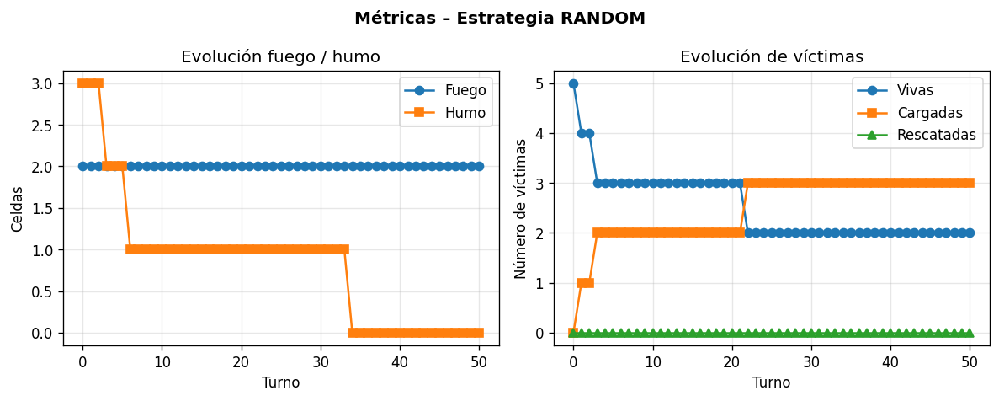

In [42]:
mostrar_metricas(metrics_random, titulo="Métricas – Estrategia RANDOM")

In [43]:
# 2) Estrategia ZONAS
anim_zonas, metrics_zonas = crear_animacion_desde_archivo(
    "simpsons_flashpoint_zonas.json",
    titulo_simulacion="Simpsons Flashpoint – Zonas"
)
anim_zonas

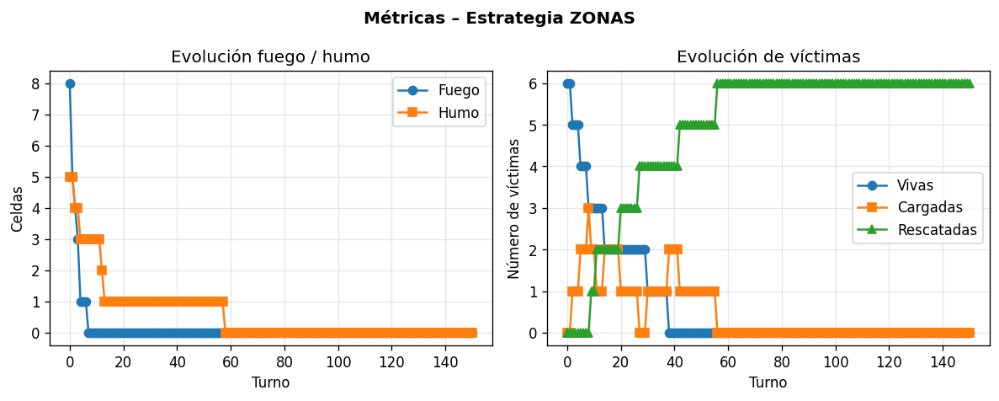

In [44]:
mostrar_metricas(metrics_zonas, titulo="Métricas – Estrategia ZONAS")